In [1]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import anndata 
import seaborn as sns
from scipy.stats import zscore
from scipy import sparse 
import itertools

import matplotlib.pyplot as plt
import collections
from sklearn.cluster import KMeans
from sklearn import metrics

from sklearn.decomposition import PCA
from umap import UMAP

from matplotlib.colors import LinearSegmentedColormap

from scroutines.config_plots import *
from scroutines import powerplots # .config_plots import *
from scroutines import pnmf
from scroutines import basicu


In [6]:
# f = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/annot/gencode.vM32.annotation.gtf.gz'
# gtf = pd.read_csv(f, sep='\t', skiprows=7)

In [2]:
outdir     = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results"
outdir_fig = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/figures"

In [3]:
adata_raw = anndata.read("../../data/cheng21_cell_scrna/reorganized/all_IT.h5ad")
adata_raw = adata_raw[adata_raw.obs['Subclass']=='L2/3']
adata_raw = adata_raw[adata_raw.obs['cond'].isin(['P28NR', 'P28DR'])]
counts = adata_raw.X
allgenes = adata_raw.var.index.values
adata_raw

View of AnnData object with n_obs × n_vars = 8748 × 53801
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond'

In [4]:
# get updated cell types
f = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results/allL23_newtypes.csv"
meta = pd.read_csv(f, index_col=0)
meta

/tmp/ipykernel_241719/12491127.py:3: DtypeWarning: Columns (1,4) have mixed types. Specify dtype option on import or set low_memory=False.
  meta = pd.read_csv(f, index_col=0)


,Class_broad,Doublet,Doublet Score,batch,leiden,n_counts,n_genes,percent_mito,sample,Type,Subclass,cond,easitype,umap1,umap2,easisample,easicond,newtype
AAACGCTCACTTCATT-1-P8_1a-P8,Excitatory,False,0.025713,1,0,23384.0,4943,0.000128,P8_1a,L2/3_AB,L2/3,P8NR,L2/3_A,NaN,NaN,1a,1-P08NR,L2/3_A
AAAGGATAGGTGCATG-1-P8_1a-P8,Excitatory,False,0.011883,1,0,17774.0,4698,0.000169,P8_1a,L2/3_AB,L2/3,P8NR,L2/3_A,NaN,NaN,1a,1-P08NR,L2/3_A
AAAGGGCCAGTATACC-1-P8_1a-P8,Excitatory,False,0.024667,1,0,15872.0,4173,0.000126,P8_1a,L2/3_AB,L2/3,P8NR,L2/3_A,NaN,NaN,1a,1-P08NR,L2/3_A
AAAGTCCCATATACCG-1-P8_1a-P8,Excitatory,False,0.027921,1,0,20076.0,4761,0.000050,P8_1a,L2/3_AB,L2/3,P8NR,L2/3_A,NaN,NaN,1a,1-P08NR,L2/3_A
AAAGTCCTCAGATGCT-1-P8_1a-P8,Excitatory,False,0.009527,1,4,19061.0,4601,0.000000,P8_1a,L2/3_BC,L2/3,P8NR,L2/3_C,NaN,NaN,1a,1-P08NR,L2/3_C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTCAGTTGTTG-1-P38_dr_1a,NaN,False,0.042872,11,1,11379.0,3568,0.000879,P38_dr_1a,L2/3_3,L2/3,P38DR,L2/3_C,NaN,NaN,1a,2-P38DR,L2/3_B
TTTGGTTTCTGCCTGT-1-P38_dr_2b,NaN,False,0.007108,2,1,16050.0,3104,0.000062,P38_dr_2b,L2/3_3,L2/3,P38DR,L2/3_C,NaN,NaN,2b,2-P38DR,L2/3_B
TTTGTTGCACCGGTCA-1-P38_dr_2a,NaN,False,0.030928,2,1,13955.0,3739,0.001146,P38_dr_2a,L2/3_3,L2/3,P38DR,L2/3_C,NaN,NaN,2a,2-P38DR,L2/3_B
TTTGTTGGTGGCTAGA-1-P38_dr_2b,NaN,False,0.015884,3,4,7272.0,2789,0.000963,P38_dr_2b,L2/3_2,L2/3,P38DR,L2/3_B,NaN,NaN,2b,2-P38DR,L2/3_A


In [5]:
# update new type 
adata_raw.obs['newtype'] = adata_raw.obs['Type'].copy()
adata_raw.obs.update(meta[['newtype']])

/tmp/ipykernel_241719/3478751590.py:2: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_raw.obs['newtype'] = adata_raw.obs['Type'].copy()


In [6]:
conds = adata_raw.obs['cond'].values
types = adata_raw.obs['Type'].values
newtypes = adata_raw.obs['newtype'].values
samps = adata_raw.obs['sample'].values

rename_dict = {
    "L2/3_A": "L2/3_A",
    "L2/3_B": "L2/3_B",
    "L2/3_C": "L2/3_C",
    
    "L2/3_1": "L2/3_A",
    "L2/3_2": "L2/3_B",
    "L2/3_3": "L2/3_C",
    
    "L2/3_AB": "L2/3_A",
    "L2/3_BC": "L2/3_C",
}

def rename(x):
    """
    """
    if x in rename_dict.keys():
        return rename_dict[x]
    else:
        return x
    
adata_raw.obs['easitype'] = adata_raw.obs['Type'].apply(rename)

In [7]:
f = '/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results/P28NR_ITgrad_genes_n749_n338unq_230420.csv'
df2 = pd.read_csv(f)
genes_it = df2['gene'].unique()
# genes_it

In [8]:
# use those 286 genes
# df = pd.read_csv("../../data/cheng21_cell_scrna/res/candidate_genes_vincent_0503_v2.csv")
df = pd.read_csv("../../data/cheng21_cell_scrna/res/L23-ABC-genes-n288-n286unq-annot.csv")
genes_l23 = df['gene'].values
# genes_sel = adata_raw.var.index.values
# genes_grp = df['P17on'].astype(str).values
# assert len(genes_sel) == len(np.unique(genes_sel))

# Use P28 ordering
f = '../../results/gene_ptime_P28_L23_Mar27.tsv'
gpt = pd.read_csv(f)
gpt = gpt['gene_ptime'].values
gptidx = np.argsort(gpt)

In [9]:
genes_it.shape, genes_l23.shape, np.intersect1d(genes_it, genes_l23).shape

((338,), (286,), (89,))

In [10]:
# filter genes
cond = np.ravel((adata_raw.X>0).sum(axis=0)) > 10 # expressed in more than 10 cells
adata_sub = adata_raw[:,cond]

# counts
x = adata_sub.X
cov = adata_sub.obs['n_counts'].values
genes = adata_sub.var.index.values

# CP10k
xn = (sparse.diags(1/cov).dot(x))*1e4

# log10(CP10k+1)
xln = xn.copy()
xln.data = np.log10(xln.data+1)

adata_sub.layers['norm'] = xn
adata_sub.layers['lognorm'] = xln

In [11]:
adata_sub.shape

(8748, 21222)

In [12]:
# select HVGs with mean and var
nbin = 20
qth = 0.3

# min
gm = np.ravel(xn.mean(axis=0))

# var
tmp = xn.copy()
tmp.data = np.power(tmp.data, 2)
gv = np.ravel(tmp.mean(axis=0))-gm**2

# cut 
lbl = pd.qcut(gm, nbin, labels=np.arange(nbin))
gres = pd.DataFrame()
gres['name'] = genes
gres['lbl'] = lbl
gres['mean'] = gm
gres['var'] = gv
gres['ratio']= gv/gm

# select
gres_sel = gres.groupby('lbl')['ratio'].nlargest(int(qth*(len(gm)/nbin))) #.reset_index()
gsel_idx = np.sort(gres_sel.index.get_level_values(1).values)

assert np.all(gsel_idx != -1)

In [13]:
l23_gidx = basicu.get_index_from_array(genes, genes_l23)
assert np.all(l23_gidx != -1)

it_gidx = basicu.get_index_from_array(genes, genes_it)
assert np.all(it_gidx != -1)

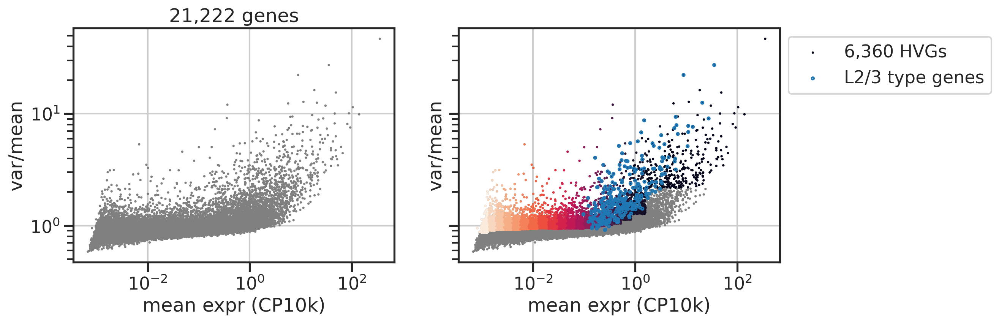

In [14]:
fig, axs = plt.subplots(1,2, figsize=(6*2,4), sharex=True, sharey=True)
ax = axs[0]
ax.scatter(gm, gv/gm, s=5, edgecolor='none', color='gray')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('mean expr (CP10k)')
ax.set_ylabel('var/mean')
ax.set_title(f'{len(gm):,} genes')

ax = axs[1]
ax.scatter(gm, gv/gm, s=5, edgecolor='none', color='gray')
ax.scatter(gm[gsel_idx], (gv/gm)[gsel_idx], c=lbl[gsel_idx], s=5, edgecolor='none', cmap='rocket_r', label=f'{len(gsel_idx):,} HVGs')
ax.scatter(gm[l23_gidx], (gv/gm)[l23_gidx], s=5, facecolors='none', edgecolor='C0', label='L2/3 type genes')
# ax.scatter(gm[it_gidx], (gv/gm)[it_gidx], s=5, facecolors='none', edgecolor='C1', label='IT genes')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel('mean expr (CP10k)')
ax.set_ylabel('var/mean')
ax.legend(bbox_to_anchor=(1,1))

plt.show()

In [15]:
adata = adata_sub[:,gsel_idx]
# adata = adata_sub[:,it_gidx]
genes_sel = adata.var.index.values
lognorm = np.array(adata.layers['lognorm'].todense())
zlognorm = zscore(lognorm, axis=0)
adata

View of AnnData object with n_obs × n_vars = 8748 × 6360
    obs: 'Class_broad', 'Doublet', 'Doublet Score', 'batch', 'leiden', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'Type', 'Subclass', 'cond', 'newtype', 'easitype'
    layers: 'norm', 'lognorm'

In [16]:
%%time
np.random.seed(0)
pca = PCA(n_components=50)
pcs = pca.fit_transform(zlognorm)
ucs = UMAP(n_components=2, n_neighbors=50).fit_transform(pcs)

CPU times: user 9min 26s, sys: 19.6 s, total: 9min 46s
Wall time: 39.4 s


In [17]:
pc1_v = pca.components_[0]
pc1_idx = np.argsort(np.abs(pc1_v))[::-1]
for i in genes_sel[pc1_idx][:100]:
    print(i)

Pcsk1n
Calm1
Nrgn
Stmn1
Tmsb4x
Aldoa
Ubb
Cck
Gm42418
Ncdn
Calm3
Cfl1
Sncb
Hsp90ab1
Rab3a
Cox8a
Tubb5
Ptms
Camk2n1
Actb
Junb
2900097C17Rik
Ubc
Fth1
Slc25a4
Purb
Tuba4a
Ppia
Gm9843
Dynll1
Ckb
Eef1a1
Actg1
Itm2c
Atxn7l3b
Psap
Calm2
Aes
Egr1
Tpi1
Chchd10
Pgam1
Map1lc3a
Ndufa4
Eef1a2
Egr4
Tubb2a
Bex2
Eif5a
Aplp1
Eif1
Mrfap1
Uchl1
Selenow
Fos
Jund
Pkm
Rpl41
Tuba1b
Cst3
Ttc9b
Gm9794
Atp6v1f
Malat1
Rtn1
Ptma
Ywhah
Dynll2
Itm2b
Hspa8
Rplp1
Nefl
Serinc1
Pebp1
C1qtnf4
Vamp2
Atp6v0e2
Ppp2r1a
Thy1
Pnmal2
Gng3
Gabarapl1
Hsp90aa1
Syp
Gm12338
Stmn3
Rpl37rt
Hpca
Nptxr
Marcks
Btg2
Nsg1
Atp5b
Gm10250
Wdr89
Ywhab
Rpl3-ps1
Ddn
Mt3
Gm14539


In [18]:
pc2_v = pca.components_[1]
pc2_idx = np.argsort(np.abs(pc2_v))[::-1]
for i in genes_sel[pc2_idx][:100]:
    print(i)

Sik2
Homer1
Pcsk1
Nrd1
Ntrk2
Kdm7a
Btaf1
Tiparp
1700016P03Rik
Lncpint
Zswim6
Frmd6
R3hdm1
Rnf217
Osbpl8
Nr4a3
Sik3
Brinp1
Dnajc1
Med14
Nmnat2
Psd3
Zdbf2
Ap2b1
Hivep2
Fosl2
Arhgef3
Cpeb3
Dennd5b
Nr4a2
Tulp4
Stk40
Arl5b
Fbxo33
Rheb
Ankrd33b
Mapk4
Irs2
Cpeb4
Lonrf1
Rock2
Cmip
Slc25a25
Arih1
Ankrd17
Ralgapa1
Mbnl2
Svop
Arid5b
Vmp1
Ago3
Pde7b
Gm47423
Kdm6b
Per1
Dlg1
Kras
Egr3
Baiap2
Ifrd1
Pak1
Casc4
R3hdm2
Ina
Asap1
Spag9
Acsl4
Itgav
Cltc
Lrrk2
Trim9
Nup98
Eprs
Hspa4
Rapgef6
Lonp2
Flrt2
Ubtd2
Prim2
Ddx3y
Zfp948
Slc25a3
Ccnl1
Dusp14
Smg7
Smad1
Ndel1
Ivns1abp
Smarca5
Snap25
Hnrnpll
Arih2
Ppp1r12a
Mia3
Coq10b
Scg3
Fnbp1l
Ppme1
Tbc1d1
Ece1


In [19]:

pc3_v = pca.components_[2]
pc3_idx = np.argsort(np.abs(pc3_v))[::-1]
for i in genes_sel[pc3_idx][:100]:
    print(i)

Rfx3
Astn2
Fam155a
Epha10
Cdh12
Prkg1
Chrm2
Osbpl3
Etl4
Cadps2
Cdh13
Gabrg3
Dscaml1
Kirrel3
Pdzrn4
Rims1
Kcnq5
Rorb
Rbfox1
5730522E02Rik
Epha6
Ptprk
Gpc6
Pcdh9
Grm1
Ptchd4
Kcnh5
Gm26871
Syt17
Rph3a
B230303A05Rik
6530403H02Rik
Camk2d
Cntn5
Igsf9b
Scube1
Lrrtm4
Man2a1
March1
Snhg11
Pde8b
Meis2
Slc24a3
Adamts2
Syndig1
Ryr3
Elmo1
Robo1
Alcam
Gm13629
Igsf11
Lrp1b
Otof
Pde1a
Ccser1
Atp1a1
Ppme1
Zmat4
Cntnap2
Nlgn1
Tox
Col23a1
Dpy19l1
Dab1
Slit3
Sema6d
Frmd5
Meg3
Kcnma1
Grin2b
Arhgef28
Grik3
R3hdm1
Maf
Pld5
Slc2a13
Shisa6
Brinp1
Cacna2d3
Gm2164
Itga8
Mgat4c
Nefm
Gpc5
Eda
AI593442
Prr16
Spon1
Pam
Unc5d
Cntnap5a
Ext1
Ppm1l
Prkag2
Adgrb3
Mcc
Pcdh19
Maml3
Nckap5
Lynx1


In [20]:
pc4_v = pca.components_[3]
pc4_idx = np.argsort(np.abs(pc4_v))[::-1]
for i in genes_sel[pc4_idx][:100]:
    print(i)

Cntnap2
Sorcs3
Ntrk3
Maml3
Fam19a1
Dlgap2
Egfem1
Fgf14
Bdnf
Rapgef5
Ncam2
Sorbs2
Nptx2
Fut9
Baz1a
Cadps2
Phf21b
Mapk4
Pde10a
Matn2
Erc2
Mas1
Pdzrn3
Cdh7
Pdzd2
Cdh4
Rora
Ppm1h
Prr16
Nyap2
Gm28928
Tox
Mir670hg
Cdh20
Kctd8
Ptprg
Fmn1
Aifm3
Kirrel3
Sema3a
Kcnh7
Kcnh5
Meg3
Dtna
Prkce
Spock3
Cpne4
Trpc6
Rorb
Gm28175
Ntng1
Tsnax
Pcdh9
Parm1
Prkca
Cacnb2
Grin2a
Adamts17
Lcorl
Igfn1
Khdrbs2
Ldb2
Dcbld2
Nr3c2
Rgs7
Foxp1
Nrxn3
Snhg11
Hlf
Rab30
Nrxn1
Robo3
Prkg2
Pim1
Chrm2
Numb
Ptprk
Ube2e2
Camk2d
Kcnq5
Gm13629
Lrrc4c
Sema6d
Rgs8
Rps6ka5
Adgrd1
Dlg2-1
Ptgs2
Pam
Ltbp1
Gm20754
Pitpnc1
Samd5
Grik3
Sertm1
Gria1
A330102I10Rik
Nol4
Nell1
Pak6


In [18]:
# get results
res = pd.DataFrame(pcs, columns=np.char.add("PC", ((1+np.arange(pcs.shape[1])).astype(str))))
res['cond'] = conds
res['type'] = types
res['newtype'] = newtypes
res['samp'] = samps
res['biosamp'] = res['samp'].apply(lambda x: x[:-1])
res['umap1'] = ucs[:,0]
res['umap2'] = ucs[:,1]
res

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC48,PC49,PC50,cond,type,newtype,samp,biosamp,umap1,umap2
0,4.427578,-9.689540,1.838086,7.823680,-4.414385,-1.896773,-6.279955,-0.899321,0.840910,0.964638,...,2.086028,0.125468,2.960706,P28NR,L2/3_C,L2/3_B,P28_1a,P28_1,0.846689,-1.163406
1,-6.982108,-9.374791,3.692406,-11.023359,1.974236,0.040736,-0.917320,-1.941714,4.870755,1.141895,...,0.546942,0.253986,1.073400,P28NR,L2/3_B,L2/3_B,P28_1a,P28_1,1.240129,-0.733390
2,-5.731857,-5.830594,2.786368,9.163280,-1.070921,-2.382377,-3.545565,-1.271949,0.311384,-1.647581,...,-0.655577,0.733057,0.123615,P28NR,L2/3_C,L2/3_C,P28_1a,P28_1,-0.232807,0.325188
3,-2.059381,-8.856082,13.184319,15.744235,-1.688422,3.065917,2.031608,-5.289457,-0.450102,1.207863,...,-2.618745,1.488506,0.108721,P28NR,L2/3_C,L2/3_C,P28_1a,P28_1,-1.658807,-0.852798
4,-5.781184,-9.082463,-4.214501,-2.361599,1.417862,0.660434,-4.626848,1.556472,0.718370,2.210214,...,-4.633150,-7.921916,-9.671991,P28NR,L2/3_B,L2/3_B,P28_1a,P28_1,1.778856,0.360764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8743,29.354876,-0.272521,-1.687854,1.528530,0.074013,-1.174669,-1.913046,2.053955,-0.550500,-1.202514,...,-0.071492,1.616727,-2.133311,P28DR,L2/3_2,L2/3_A,P28_dr_1b,P28_dr_1,8.318127,4.253355
8744,9.745016,-2.647579,8.376806,-10.320629,2.782378,-1.697462,1.826543,1.812194,0.835512,-3.699713,...,-2.857763,3.615031,-1.099983,P28DR,L2/3_1,L2/3_B,P28_dr_1a,P28_dr_1,1.372201,-1.273432
8745,2.449625,9.421873,-10.784612,4.190981,0.889795,4.251647,-0.134847,-3.612058,1.616628,-3.088698,...,0.653970,-1.821033,-1.060599,P28DR,L2/3_2,L2/3_A,P28_dr_3b,P28_dr_3,3.925529,4.751793
8746,-0.977710,6.683935,-0.897307,14.920707,4.766354,-2.481114,-2.468472,-4.990632,3.013283,3.632261,...,-1.966463,-2.156942,-1.080986,P28DR,L2/3_2,L2/3_C,P28_dr_3a,P28_dr_3,4.710723,5.674429


Text(0, 0.5, 'explained var')

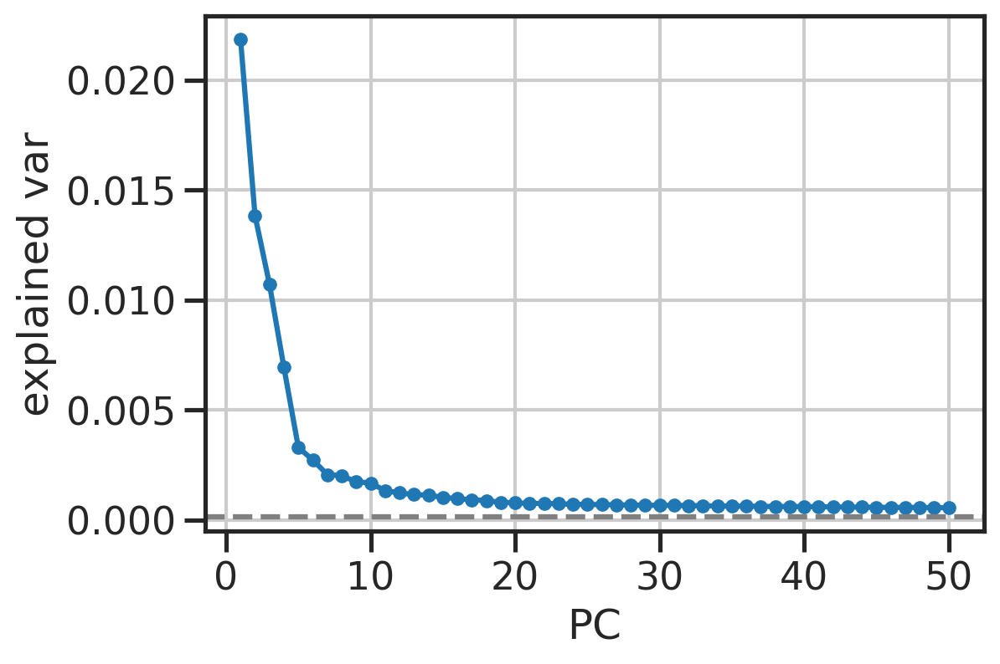

In [19]:
fig, ax = plt.subplots(figsize=(6,4))
ax.plot(np.arange(len(pca.explained_variance_ratio_))+1, pca.explained_variance_ratio_, '-o', markersize=5)
ax.axhline(1/lognorm.shape[1], linestyle='--', color='gray')
ax.set_xlabel('PC')
ax.set_ylabel('explained var')

In [20]:
colors = sns.color_palette('tab20', 10)
# 6-9
palette_biosamp = {
    'P28_1': colors[6],
    'P28_2': colors[7],
    'P28_dr_1': colors[8],
    'P28_dr_3': colors[9],
}
palette_cond = {
    'P28NR': colors[6],
    'P28DR': colors[8],
}

# 0-5
palette_type = {
    'L2/3_A': colors[0],
    'L2/3_B': colors[2],
    'L2/3_C': colors[4],
    
    'L2/3_1': colors[1],
    'L2/3_2': colors[3],
    'L2/3_3': colors[5],
}
palette_type_abc = {
    'L2/3_A': colors[0],
    'L2/3_B': colors[2],
    'L2/3_C': colors[4],
    
    'L2/3_1': 'lightgray',
    'L2/3_2': 'lightgray',
    'L2/3_3': 'lightgray',
}
colors

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589)]

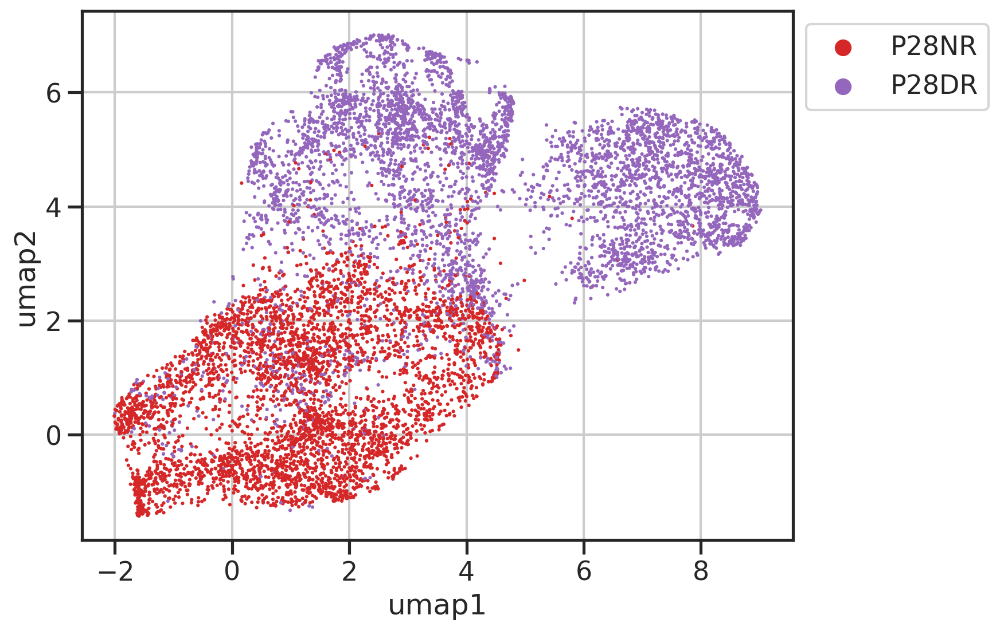

In [21]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                hue='cond',
                hue_order=list(palette_cond.keys()),
                palette=palette_cond,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
plt.show()

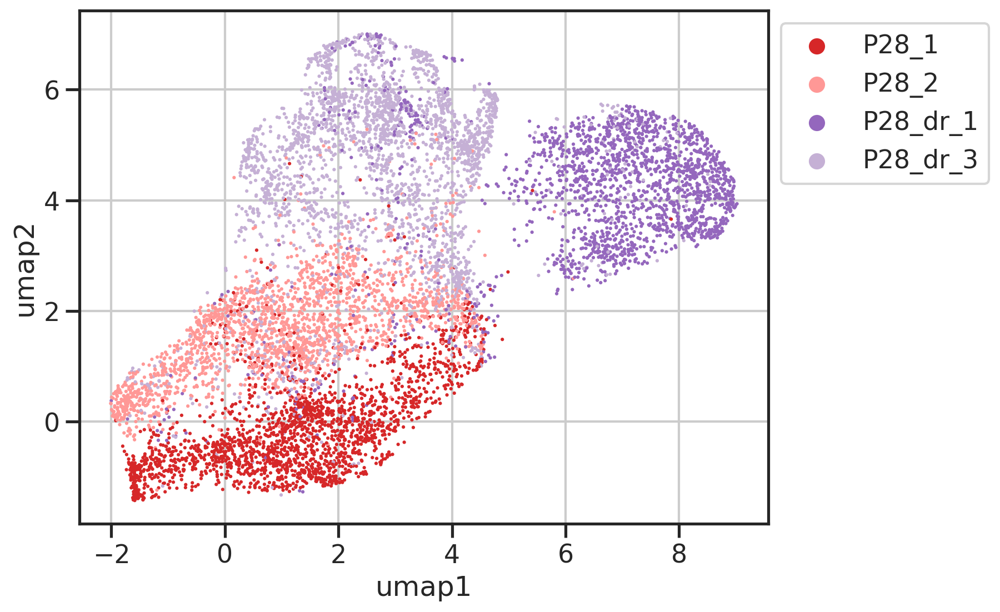

In [22]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                hue='biosamp',
                hue_order=list(palette_biosamp.keys()),
                palette=palette_biosamp,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
plt.show()

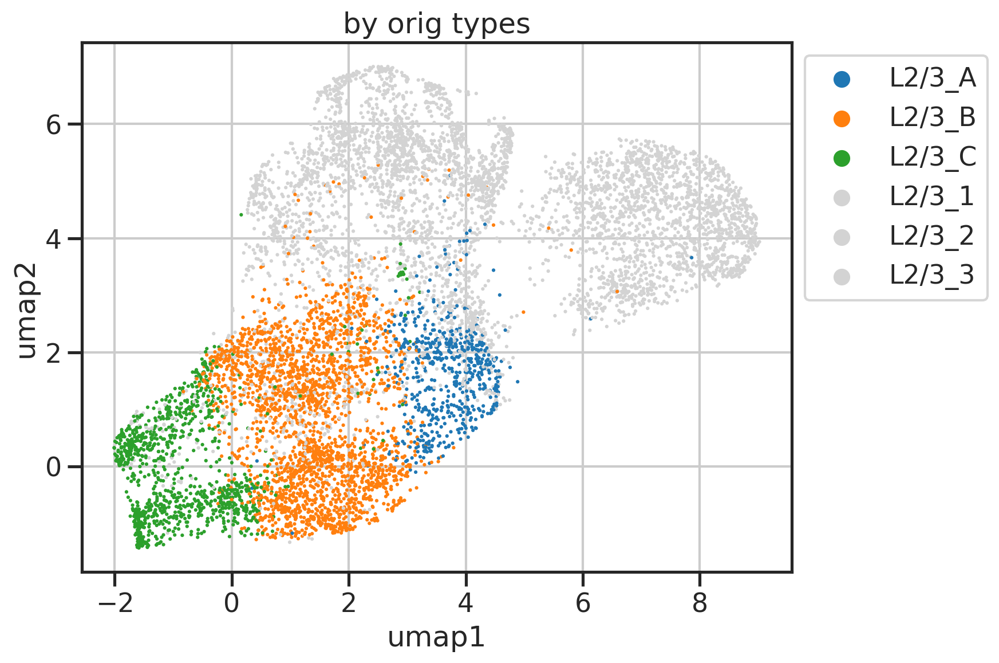

In [23]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                hue='type',
                hue_order=list(palette_type_abc.keys()),
                palette=palette_type_abc,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by orig types')
plt.show()

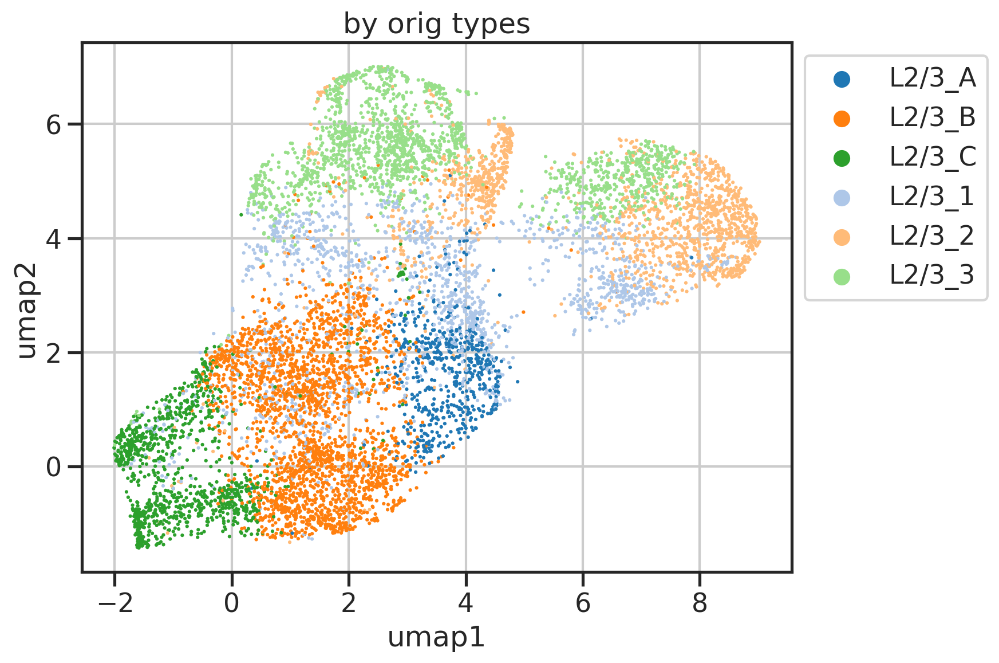

In [24]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                hue='type',
                hue_order=list(palette_type.keys()),
                palette=palette_type,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by orig types')
plt.show()

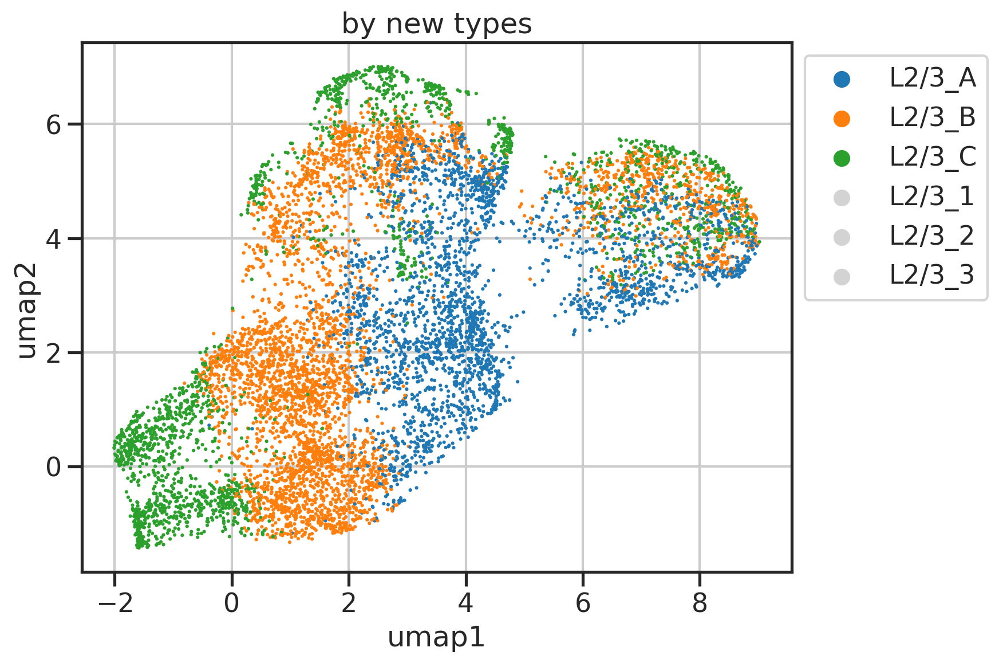

In [25]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='umap1', y='umap2', 
                hue='newtype',
                hue_order=list(palette_type_abc.keys()),
                palette=palette_type_abc,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by new types')
plt.show()

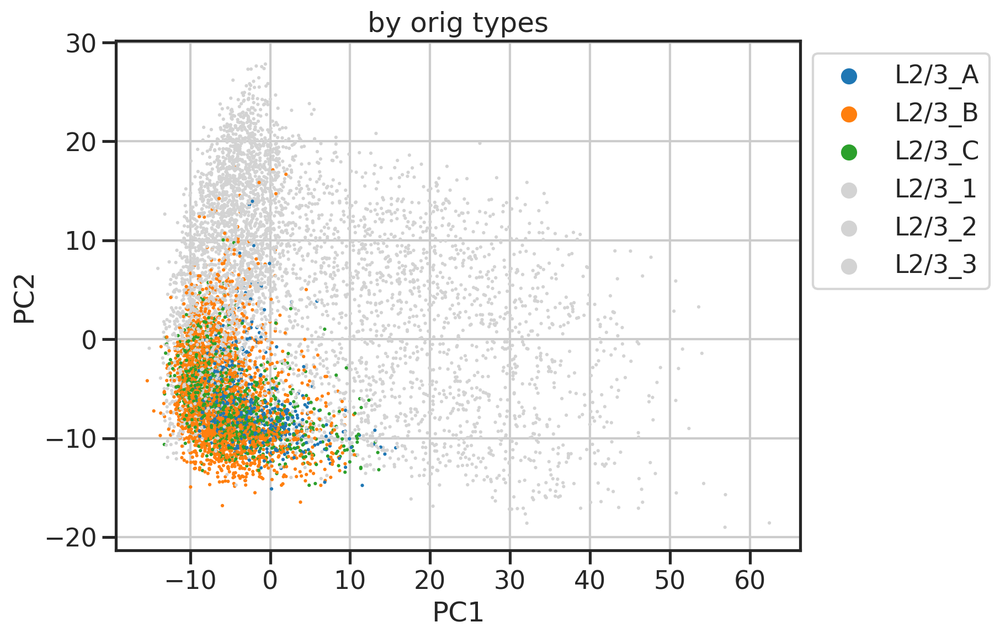

In [26]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='PC1', y='PC2', 
                hue='type',
                hue_order=list(palette_type_abc.keys()),
                palette=palette_type_abc,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by orig types')
plt.show()

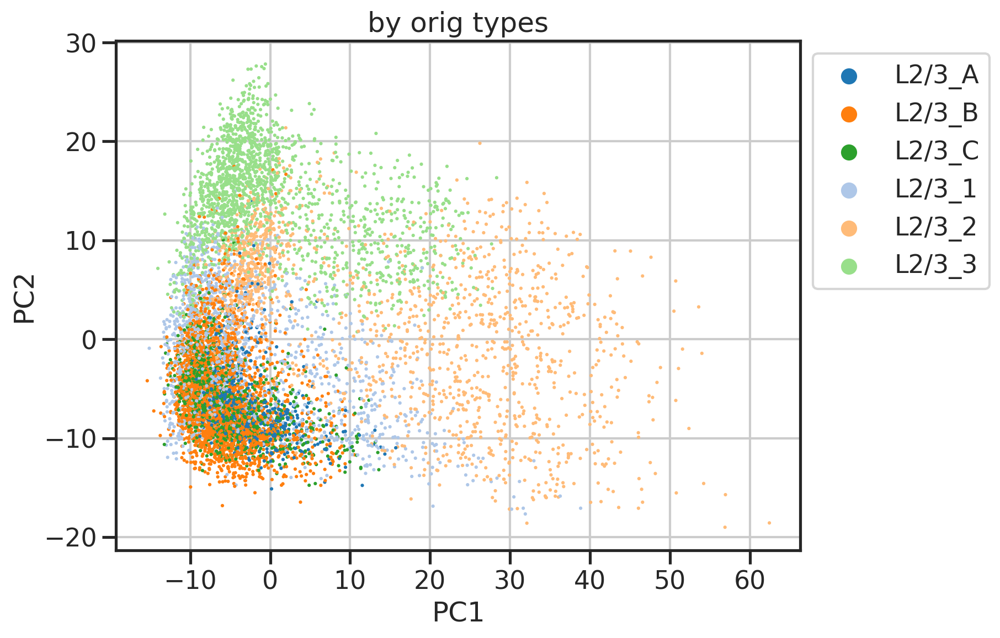

In [27]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='PC1', y='PC2', 
                hue='type',
                hue_order=list(palette_type.keys()),
                palette=palette_type,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by orig types')
plt.show()

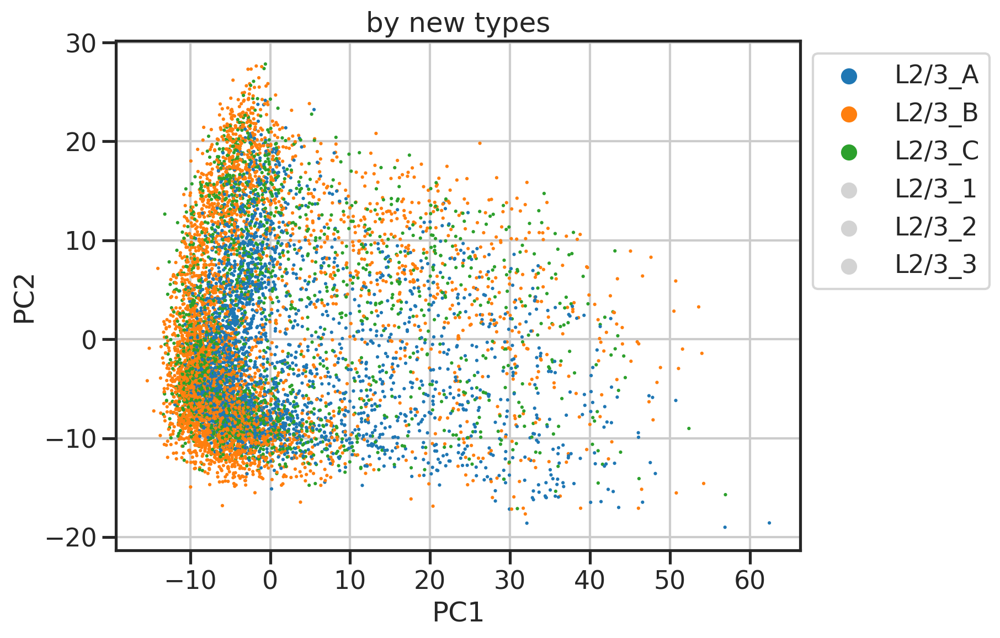

In [28]:
fig, ax = plt.subplots(1,1,figsize=(8*1,6))
sns.scatterplot(data=res.sample(frac=1, replace=False), 
                x='PC1', y='PC2', 
                hue='newtype',
                hue_order=list(palette_type_abc.keys()),
                palette=palette_type_abc,
                s=5, edgecolor='none', 
                # legend=False,
                ax=ax,
               )
ax.legend(bbox_to_anchor=(1,1))
ax.set_title('by new types')
plt.show()

In [29]:
def plot_pcs(res, npc, hue, palette=None):
    fig, axs = plt.subplots(npc-1,npc-1,figsize=(6*(npc-1),5*(npc-1)))
    for i, j in itertools.combinations(range(npc), 2):
        legend = False
        if (i,j) == (0,1): legend=True

        x, y = f"PC{j+1}", f"PC{i+1}"
        ax = axs[i,j-1]
        
        if palette is not None:
            sns.scatterplot(data=res.sample(frac=1, replace=False), 
                            x=x, y=y, 
                            hue=hue,
                            hue_order=list(palette.keys()),
                            palette=palette,
                            s=5, edgecolor='none', 
                            legend=legend,
                            ax=ax,
                           )
        else:
            sns.scatterplot(data=res.sample(frac=1, replace=False), 
                            x=x, y=y, 
                            hue=hue,
                            # hue_order=list(palette.keys()),
                            # palette=palette,
                            s=5, edgecolor='none', 
                            legend=legend,
                            ax=ax,
                           )
        sns.despine(ax=ax)
    axs[0,0].legend(bbox_to_anchor=(0.5, -0.2), loc='upper center')

    for i, j in itertools.product(range(npc-1), range(npc-1)):
        if j<i:
            ax = axs[i,j]
            ax.axis('off')

    plt.show()

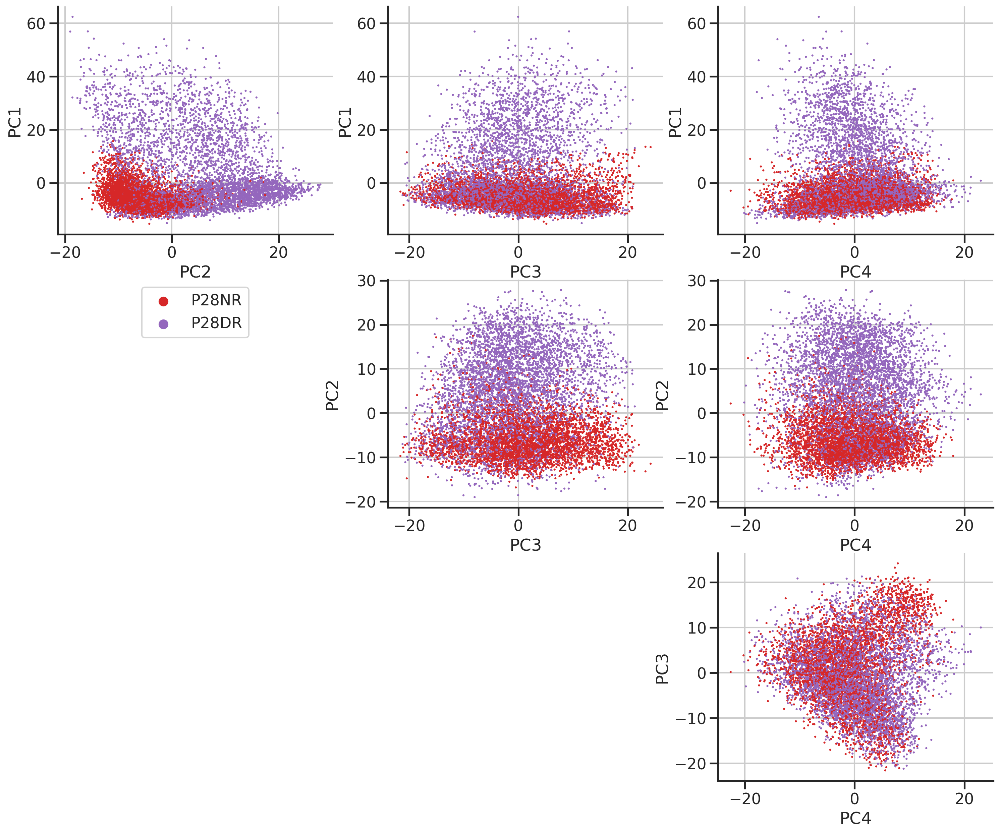

In [30]:
plot_pcs(res, 4, 'cond', palette=palette_cond)

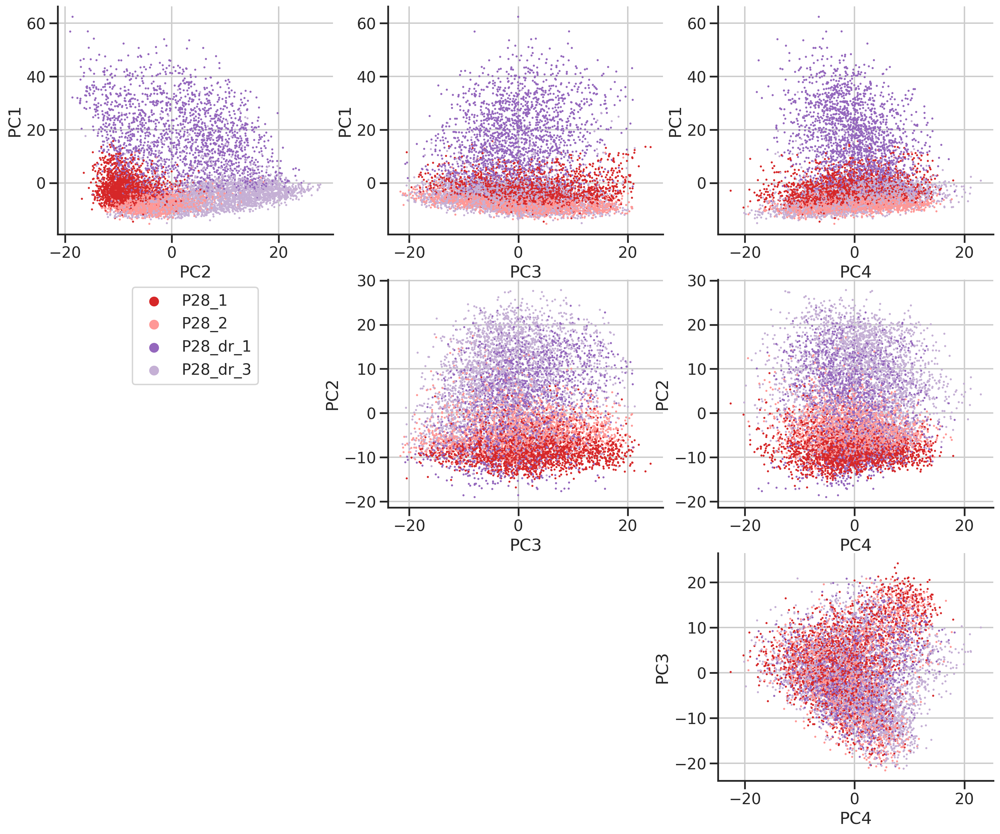

In [31]:
plot_pcs(res, 4, 'biosamp', palette=palette_biosamp)

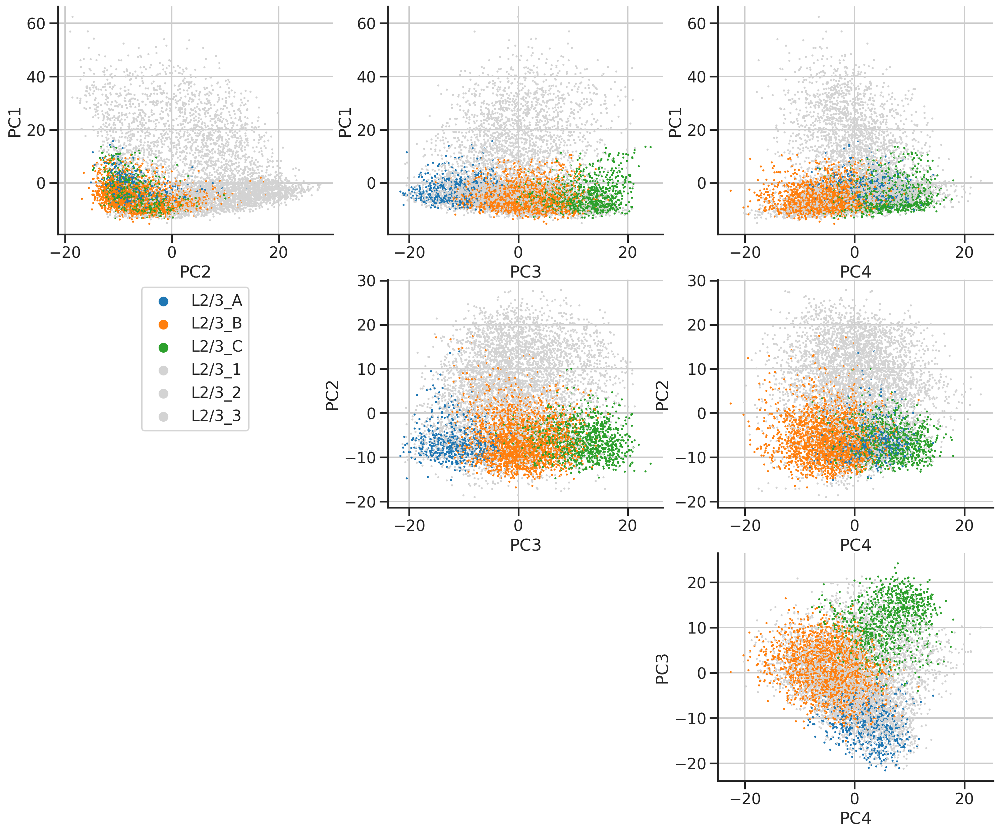

In [32]:
plot_pcs(res, 4, 'type', palette=palette_type_abc)

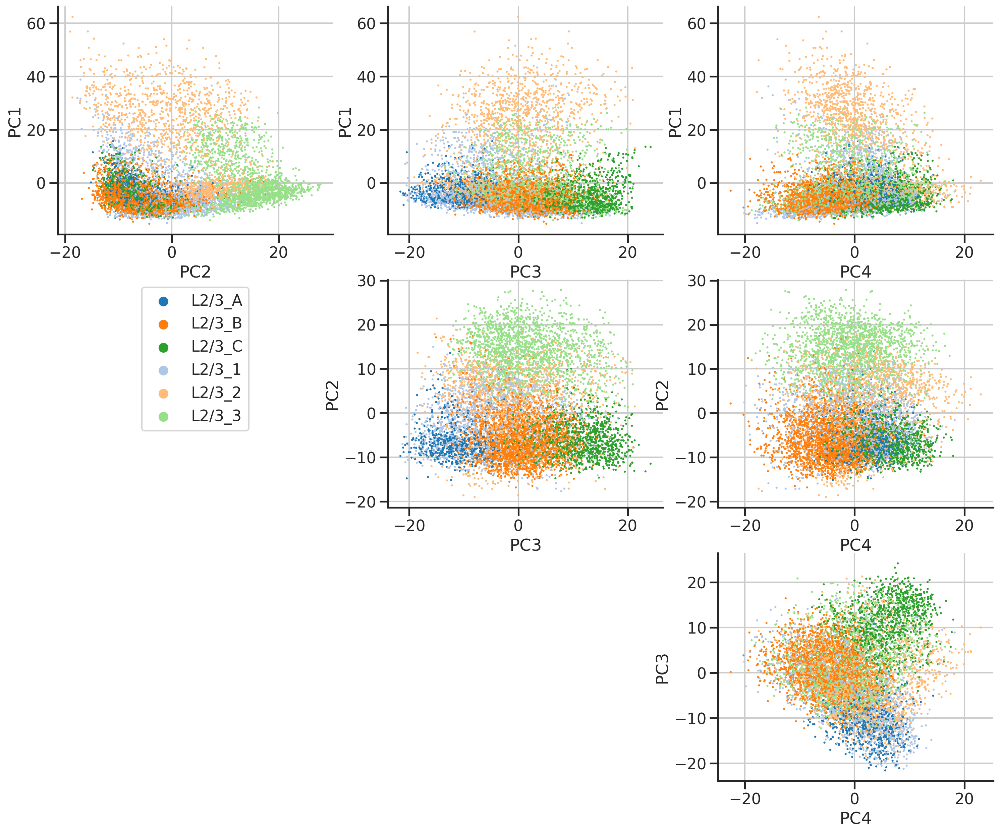

In [33]:
plot_pcs(res, 4, 'type', palette=palette_type)

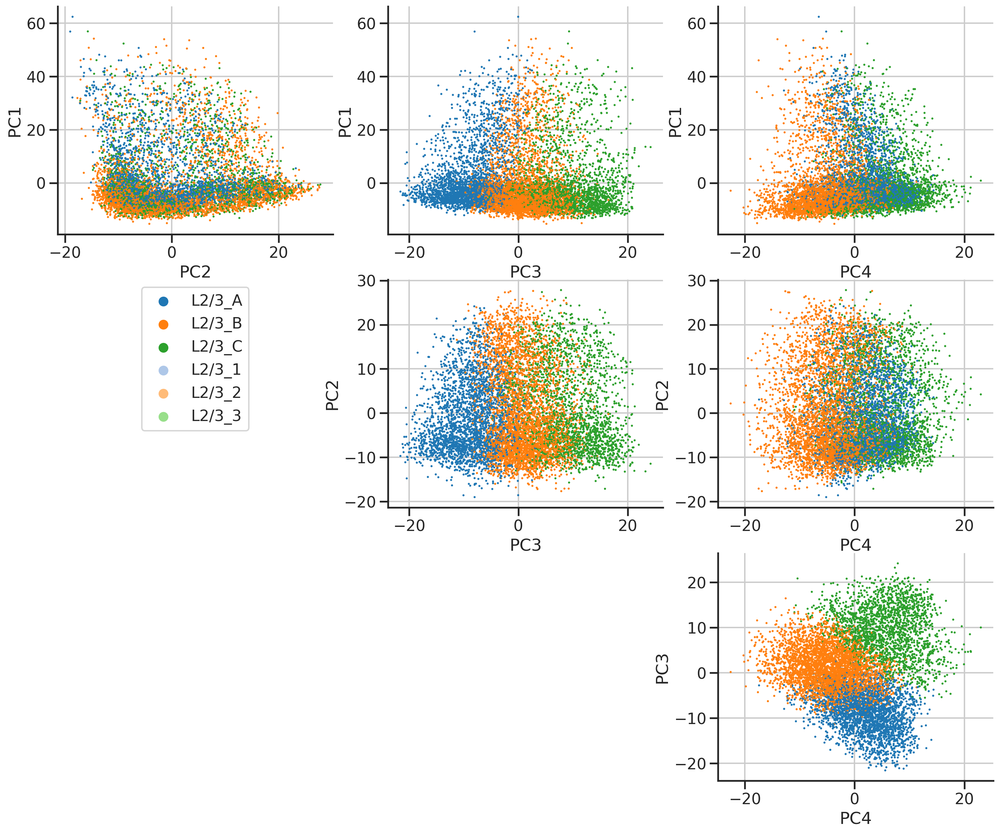

In [34]:
plot_pcs(res, 4, 'newtype', palette=palette_type)

In [35]:
res

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC48,PC49,PC50,cond,type,newtype,samp,biosamp,umap1,umap2
0,4.427578,-9.689540,1.838086,7.823680,-4.414385,-1.896773,-6.279955,-0.899321,0.840910,0.964638,...,2.086028,0.125468,2.960706,P28NR,L2/3_C,L2/3_B,P28_1a,P28_1,0.846689,-1.163406
1,-6.982108,-9.374791,3.692406,-11.023359,1.974236,0.040736,-0.917320,-1.941714,4.870755,1.141895,...,0.546942,0.253986,1.073400,P28NR,L2/3_B,L2/3_B,P28_1a,P28_1,1.240129,-0.733390
2,-5.731857,-5.830594,2.786368,9.163280,-1.070921,-2.382377,-3.545565,-1.271949,0.311384,-1.647581,...,-0.655577,0.733057,0.123615,P28NR,L2/3_C,L2/3_C,P28_1a,P28_1,-0.232807,0.325188
3,-2.059381,-8.856082,13.184319,15.744235,-1.688422,3.065917,2.031608,-5.289457,-0.450102,1.207863,...,-2.618745,1.488506,0.108721,P28NR,L2/3_C,L2/3_C,P28_1a,P28_1,-1.658807,-0.852798
4,-5.781184,-9.082463,-4.214501,-2.361599,1.417862,0.660434,-4.626848,1.556472,0.718370,2.210214,...,-4.633150,-7.921916,-9.671991,P28NR,L2/3_B,L2/3_B,P28_1a,P28_1,1.778856,0.360764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8743,29.354876,-0.272521,-1.687854,1.528530,0.074013,-1.174669,-1.913046,2.053955,-0.550500,-1.202514,...,-0.071492,1.616727,-2.133311,P28DR,L2/3_2,L2/3_A,P28_dr_1b,P28_dr_1,8.318127,4.253355
8744,9.745016,-2.647579,8.376806,-10.320629,2.782378,-1.697462,1.826543,1.812194,0.835512,-3.699713,...,-2.857763,3.615031,-1.099983,P28DR,L2/3_1,L2/3_B,P28_dr_1a,P28_dr_1,1.372201,-1.273432
8745,2.449625,9.421873,-10.784612,4.190981,0.889795,4.251647,-0.134847,-3.612058,1.616628,-3.088698,...,0.653970,-1.821033,-1.060599,P28DR,L2/3_2,L2/3_A,P28_dr_3b,P28_dr_3,3.925529,4.751793
8746,-0.977710,6.683935,-0.897307,14.920707,4.766354,-2.481114,-2.468472,-4.990632,3.013283,3.632261,...,-1.966463,-2.156942,-1.080986,P28DR,L2/3_2,L2/3_C,P28_dr_3a,P28_dr_3,4.710723,5.674429
